<div align=center>

<p></p>
<p></p>
<font size=5>
In the Name of God
<font/>
<p></p>
 <br/>
    <br/>
<font color=#4d7db8>
Sharif University of Technology - Department of Electrical Engineering
</font>
<p></p>
<font color=#4d7db8>
Introduction To Machine Learning - Dr. Sajjad Amini
</font>
<br/>
<br/>
Spring Semester 1401-02

<div/>

<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
        Project - 3rd Phase
        <br />
        Image Colorization using Autoencoder
			</font>
    <br/>
<font size=4>
			<br/><br/>
Due on Tir 10th
                <br/><b>
              Cheating is Strongly Prohibited
                </b><br/><br/>
                <font color=green>
Should you have any questions concerning the project, please feel free to ask via Telegram.
     </font>
</font>
                <br/>
    </div>

# Personal Info
<hr/>
    <div class="column" align=center>
    <font size=4>
        <div class="column">
        <br />
            student_number = 99106522
            <br />
            Name = Shabnam   
            <br />
            Last_Name = Fazliani
        </div>
        <div class="column">
        <br />
            student_number = 99106493
            <br />
            Name = Mohammad   
            <br />
            Last_Name = Ghafourian
        </div>
    </font>
    </div>


1. Download the "landscape image colorization" dataset and slice it to `train_set`, `validation_set` and `test_set`.
2. Design and train an AutoEncoder using `PyTorch` (not `TensorFlow`) on the dataset to colorize grayscale images
3. plot learning curve and visualize grayscale images of test set, their corresponding color images and their colorized versions side by side.

# Import Necessary Libraries

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, utils
from PIL import Image
from sklearn.model_selection import train_test_split

# Load Dataset and Prepare It

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

data_folder = "/content/gdrive/MyDrive/landscape Images"
gray_folder = os.path.join(data_folder, 'gray')
color_folder = os.path.join(data_folder, 'color')

gray_images = os.listdir(gray_folder)
color_images = os.listdir(color_folder)

# Sorting the images
gray_images.sort()
color_images.sort()

# Splitting the dataset into train, validation, and test sets (80%, 10%, 10%).
train_gray, temp_gray, train_color, temp_color = train_test_split(gray_images, color_images, test_size=0.2, random_state=42)
validation_gray, test_gray, validation_color, test_color = train_test_split(temp_gray, temp_color, test_size=0.5, random_state=42)

# Printing the number of images in each set for verification.
print("Train set size:", len(train_gray))
print("Validation set size:", len(validation_gray))
print("Test set size:", len(test_gray))

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Train set size: 5703
Validation set size: 713
Test set size: 713


# Define Your Model

In [5]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=2, padding=1),  # Input: 1 channel (grayscale), Output: 16 channels
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1), # Input: 16 channels, Output: 32 channels
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1), # Input: 32 channels, Output: 16 channels
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, kernel_size=4, stride=2, padding=1),  # Input: 16 channels, Output: 3 channels (colorized)
            nn.Tanh(),  # Use Tanh activation instead of Sigmoid
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


class ColorizationDataset(Dataset):
    def __init__(self, gray_folder, color_folder, transform=None):
        self.gray_images = gray_folder
        self.color_images = color_folder
        self.transform = transform

    def __len__(self):
        return len(self.gray_images)

    def __getitem__(self, idx):
        gray_path = os.path.join(gray_folder, self.gray_images[idx])
        color_path = os.path.join(color_folder, self.color_images[idx])

        gray_image = Image.open(gray_path).convert('L')  # Convert to grayscale (1 channel)
        color_image = Image.open(color_path).convert('RGB')  # Convert to RGB (3 channels)

        # Resize the images to a fixed size
        gray_image = gray_image.resize((256, 256), Image.BICUBIC)
        color_image = color_image.resize((256, 256), Image.BICUBIC)


        if self.transform:
            gray_image = self.transform(gray_image)
            color_image = self.transform(color_image)

        return gray_image, color_image

# Set the device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the transformation to apply to the images
transform = transforms.Compose([
    # transforms.Resize((152, 152)),  # Resize the images to the same size
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

# Create instances of the dataset and dataloaders
train_dataset = ColorizationDataset(train_gray, train_color, transform)
validation_dataset = ColorizationDataset(validation_gray, validation_color, transform)
test_dataset = ColorizationDataset(test_gray, test_color, transform)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
validation_dataloader = DataLoader(validation_dataset, batch_size=32, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Fit The Model

Also Define optimizer, Criterion and other parameters

Epoch [1/10], Train Loss: 0.0831, Validation Loss: 0.0429
Epoch [2/10], Train Loss: 0.0409, Validation Loss: 0.0349
Epoch [3/10], Train Loss: 0.0362, Validation Loss: 0.0326
Epoch [4/10], Train Loss: 0.0338, Validation Loss: 0.0303
Epoch [5/10], Train Loss: 0.0324, Validation Loss: 0.0293
Epoch [6/10], Train Loss: 0.0312, Validation Loss: 0.0286
Epoch [7/10], Train Loss: 0.0304, Validation Loss: 0.0280
Epoch [8/10], Train Loss: 0.0298, Validation Loss: 0.0283
Epoch [9/10], Train Loss: 0.0294, Validation Loss: 0.0271
Epoch [10/10], Train Loss: 0.0291, Validation Loss: 0.0267


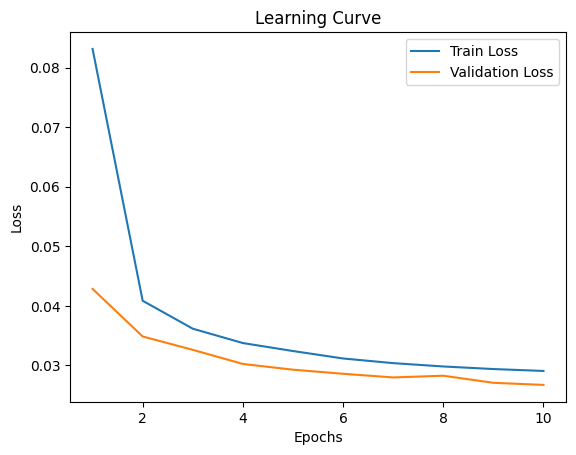

In [6]:
# Create an instance of the AutoEncoder model
autoencoder = AutoEncoder().to(device)

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 10
train_losses = []
validation_losses = []

for epoch in range(num_epochs):
    # Training
    autoencoder.train()
    train_loss = 0.0
    for gray_images, color_images in train_dataloader:
        gray_images = gray_images.to(device)
        color_images = color_images.to(device)

        # Forward pass
        outputs = autoencoder(gray_images)

        # Compute the loss
        loss = criterion(outputs, color_images)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * gray_images.size(0)

    train_loss /= len(train_dataloader.dataset)
    train_losses.append(train_loss)

    # Validation
    autoencoder.eval()
    validation_loss = 0.0
    with torch.no_grad():
        for gray_images, color_images in validation_dataloader:
            gray_images = gray_images.to(device)
            color_images = color_images.to(device)

            outputs = autoencoder(gray_images)
            loss = criterion(outputs, color_images)
            validation_loss += loss.item() * gray_images.size(0)

    validation_loss /= len(validation_dataloader.dataset)
    validation_losses.append(validation_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {validation_loss:.4f}")

# Plotting the learning curve
import matplotlib.pyplot as plt

plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), validation_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Learning Curve')
plt.legend()
plt.show()

# Plot The Results

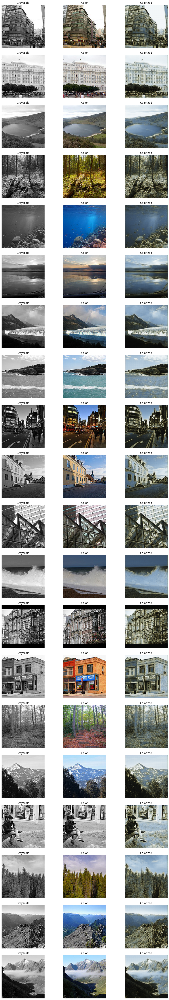

In [15]:
# Visualize grayscale images, their corresponding color images, and colorized versions
autoencoder.eval()
test_gray_images = []
test_color_images = []
test_colorized_images = []

with torch.no_grad():
    for gray_images, color_images in test_dataloader:
        gray_images = gray_images.to(device)
        color_images = color_images.to(device)

        test_gray_images.append(gray_images)
        test_color_images.append(color_images)

        outputs = autoencoder(gray_images)
        test_colorized_images.append(outputs.cpu())

# Concatenate and visualize the images
test_gray_images = torch.cat(test_gray_images)
test_color_images = torch.cat(test_color_images)
test_colorized_images = torch.cat(test_colorized_images)

# Denormalize the images
test_gray_images = test_gray_images * 0.5 + 0.5
test_color_images = test_color_images * 0.5 + 0.5
test_colorized_images = test_colorized_images * 0.5 + 0.5

# Convert tensors to numpy arrays
test_gray_images = test_gray_images.numpy()
test_color_images = test_color_images.numpy()
test_colorized_images = test_colorized_images.numpy()

# Reshape the images
test_gray_images = np.transpose(test_gray_images, (0, 2, 3, 1))
test_color_images = np.transpose(test_color_images, (0, 2, 3, 1))
test_colorized_images = np.transpose(test_colorized_images, (0, 2, 3, 1))

# Plot the images
num_examples = 20

fig, axes = plt.subplots(num_examples, 3, figsize=(12, 64))
fig.tight_layout()

for i in range(num_examples):
    axes[i, 0].imshow(test_gray_images[i], cmap="gray")
    axes[i, 0].set_title("Grayscale")

    axes[i, 1].imshow(test_color_images[i])
    axes[i, 1].set_title("Color")

    axes[i, 2].imshow(test_colorized_images[i])
    axes[i, 2].set_title("Colorized")

    for j in range(3):
        axes[i, j].axis("off")

plt.show()
